# GANomaly with Spectral Nomrmalisation: Semi-Supervised Anomaly Detection via Adversarial Training (Method 3 - GANomaly with Spectral Normalisation)

This notebook is based on the original GANomaly architecture proposed by Akcay et al, in 2018 (https://arxiv.org/abs/1805.06725). The model employs DCGAN architecutre (https://arxiv.org/abs/1511.06434) to create a new anomaly detection model using encoder-decoder-encoder sub-networks that generates high-dimensional image space. The model is trained solely on normal data (in our case undamaged car images), and it attemps to map the input image to a representative latent space, which is then used to reconstruct the generated output image. To map the generated image back to its latent representation, additional encoder network is used. The distance between the input image and the generated image, as well as their latent representations, are minimised during training.

<img src="../GANomaly.png" width="800" height="400">
- <i>Figure A. GANomaly model architechture with Encoder Decoder and Encoder network and the discriminator. </i>
    

The original architecture was built using a PyTorch library which is publicly available in a GitHub repository (https://github.com/samet-akcay/ganomaly). To gain a deeper familiarity with the model and more leeway for customization, we programmed the model architecture from scratch using TensorFlow and Keras libraries.

This notebook is the modified version of the Method 2 (modified GANomaly method). Modifications are: 
- Spectral Normlised Discriminator


In [1]:
import py3nvml
import tensorflow as tf
import tensorflow_addons as tfa
py3nvml.grab_gpus(1, gpu_select=[0, 1, 2, 3], gpu_fraction=0.99)
physical_devices = tf.config.list_physical_devices("GPU")

In [2]:
from platform import python_version
print(python_version())
print(tf. __version__) 

3.8.10
2.8.0


## Import Libraries

In [3]:
import pandas as pd
import numpy as np
import random
import math
import os.path
from os import path
import time
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
from IPython import display
from scipy.ndimage import gaussian_filter1d

## Options

In [4]:
class Option:
    def __init__(self):
        self.seed = 123
        self.image_shape = [256, 256, 3] # input shape
        self.batch_size = 64 #input batch szie
        self.shuffle_buffer_size = 50 * self.batch_size  # buffer_size: representing the maximum number elements that will be buffered when prefetching
        self.ckpt_dir = "./GANomaly_SN_ckpt" # checkponit directory
        self.latent_dim = 512 # latent dims
        self.num_channels = 3 # input channels
        self.filters = 64 # number of generator's and discriminator's filters
        self.lr_d = 2e-4 # discriminator learning rate
        self.lr_g = 2e-4 # generator learning rate
        self.weight_decay = 1e-2 # weight decay for Adam optimizer
        self.w_adv = 1. # Adversarial loss weight
        self.w_con = 50. # Reconstruction loss weight
        self.w_enc = 1. # Encoder loss weight.
        self.beta1 = 0.5 # beta_1 momentum term for Adam optmizer
        self.beta2 = 0.999 # beta_2 momentum term for Adam optmizer
            
opt = Option()

## Load Data

In [5]:
# function to load list from an .npy file
def loadList(filename):
    arr=np.load(filename)
    return arr.tolist()

In [6]:
# saveList(train_undamaged_non_corrupt_clean,'data/train_undamaged_non_corrupt_clean.npy')
train_undamaged = loadList('/data/elnaram/nugen_npy/img_files_toyota_undamaged_3up_non_corrupt.npy')
test_damaged = loadList('/data/elnaram/nugen_npy/img_files_toyota_damaged_3up_non_corrupt.npy')

In [7]:
len(train_undamaged), len(test_damaged)

(6161, 10227)

In [8]:
validation_damaged = random.sample(test_damaged, 1000)
test_damaged = random.sample(test_damaged, 9227)

len(validation_damaged), len(test_damaged)

(1000, 9227)

## Create `Dataset` objects

In [9]:
# Adapted from https://www.tensorflow.org/tutorials/load_data/images
IMAGE_SIZE = [256, 256]

def load_img(file_path):
    # load the raw data from the file as a string
    img = tf.io.read_file(file_path)
    # convert the compressed string to a 3D uint8 tensor
    img = tf.image.decode_jpeg(img, channels=opt.num_channels)
    img = tf.image.resize(img, [256, 256])
    # img = tf.cast(img, dtype=tf.float32)

    return img

# Adapted from https://stackoverflow.com/questions/48643288/resize-image-preserving-aspect-ratio-in-tensorflow
# Resize image preserving aspect ratio in Tensorflow
def resize_image_keep_aspect(img, lo_dim=256):
    # Take width/height
    initial_width = tf.shape(img)[0]
    initial_height = tf.shape(img)[1]
    # Take the greater value, and use it for the ratio
    min_ = tf.minimum(initial_width, initial_height)
    ratio = tf.cast(min_, dtype=tf.float32) / tf.constant(lo_dim, dtype=tf.float32)
    # Asign new width and height
    new_width = tf.cast((tf.cast(initial_width, dtype=tf.float32) / ratio), dtype=tf.int32)
    new_height = tf.cast((tf.cast(initial_height, dtype=tf.float32) / ratio), dtype=tf.int32)

    return tf.image.resize(img, [new_width, new_height])

# random crop
def random_crop(img):
    img = tf.image.random_crop(img, size=[*opt.image_shape])
    return img

def normalize_img(img):
    return (tf.cast(img, tf.float32) / 127.5) - 1.0

def random_jitter(img):
    img = resize_image_keep_aspect(img, lo_dim=286)
    img = random_crop(img)
    return img

def flip(img):
    return tf.image.flip_left_right(img)

    
def load_train_dataset(filenames):
    ds = tf.data.Dataset.from_tensor_slices(filenames)
    ds = ds.map(load_img, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.concatenate(ds.map(random_jitter, num_parallel_calls=tf.data.AUTOTUNE).shuffle(opt.shuffle_buffer_size))
    ds = ds.concatenate(ds.map(flip, num_parallel_calls=tf.data.AUTOTUNE).shuffle(opt.shuffle_buffer_size))
    ds = ds.map(normalize_img, num_parallel_calls=tf.data.AUTOTUNE).shuffle(opt.shuffle_buffer_size)
    # ds = ds.cache('/data/elnaram/tfcache_train_GANomaly')
    # ds = ds.shuffle(opt.shuffle_buffer_size)
    ds = ds.batch(opt.batch_size, drop_remainder=True) 
    ds = ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    
    return ds

def load_val_dataset(filenames):
    ds = tf.data.Dataset.from_tensor_slices(filenames)
    ds = ds.map(load_img, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.map(resize_image_keep_aspect, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.map(normalize_img, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.shuffle(400)
    ds = ds.batch(8, drop_remainder=True) 
    ds = ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    
    return ds

def load_test_dataset(filenames):
    ds = tf.data.Dataset.from_tensor_slices(filenames)
    ds = ds.map(load_img, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.map(resize_image_keep_aspect, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.map(normalize_img, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(opt.batch_size, drop_remainder=False) 
    ds = ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    
    return ds

In [10]:
train_dataset = load_train_dataset(train_undamaged)
train_dataset, len(train_dataset)

2023-01-08 03:02:49.636231: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-08 03:02:52.393046: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30987 MB memory:  -> device: 0, name: Tesla V100S-PCIE-32GB, pci bus id: 0000:5e:00.0, compute capability: 7.0


(<PrefetchDataset element_spec=TensorSpec(shape=(64, 256, 256, 3), dtype=tf.float32, name=None)>,
 385)

In [11]:
val_dataset = load_val_dataset(validation_damaged)
val_dataset, len(val_dataset)

(<PrefetchDataset element_spec=TensorSpec(shape=(8, 256, 256, 3), dtype=tf.float32, name=None)>,
 125)

In [12]:
test_dataset = load_test_dataset(test_damaged)
test_dataset, len(test_dataset)

(<PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>,
 145)

## Visualize input data

In [13]:
def view_image(ds, rows=1):
    image = next(iter(ds)) # extract 1 batch from the dataset
    image = image.numpy()

    fig = plt.figure(figsize=(22, rows * 5.05 ))
    for i in range(5 * rows):
        ax = fig.add_subplot(rows, 5, i+1, xticks=[], yticks=[])
        ax.imshow(image[i] / 2 + .5, cmap='gray')

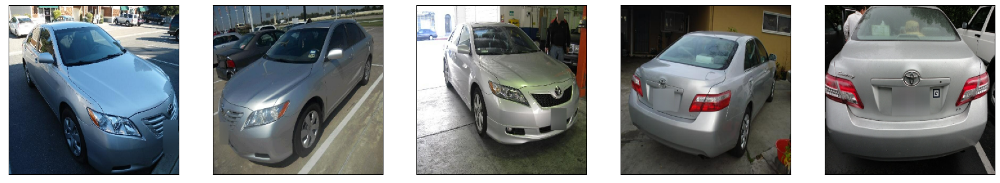

In [14]:
view_image(train_dataset)

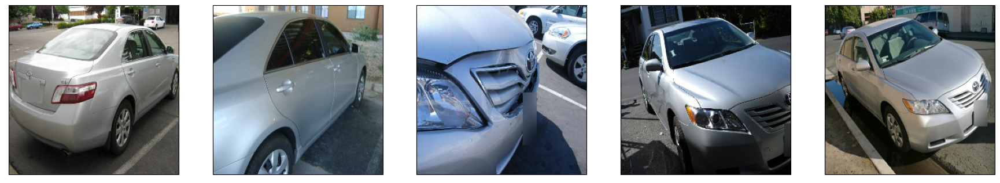

In [15]:
view_image(val_dataset)

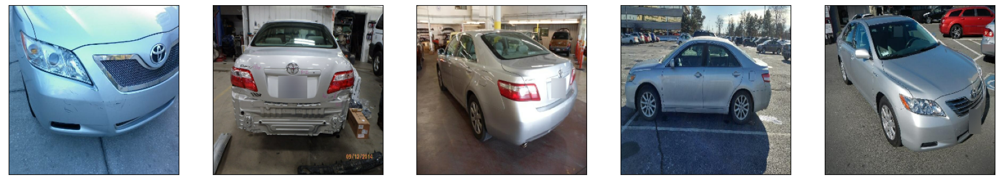

In [16]:
view_image(test_dataset)

## Models

### SpectralNormalization

In [17]:
# Adapted from https://github.com/thisisiron/spectral_normalization-tf2

class SpectralNormalization(tf.keras.layers.Wrapper):
    def __init__(self, layer, iteration=1, eps=1e-12, training=True, **kwargs):
        self.iteration = iteration
        self.eps = eps
        self.do_power_iteration = training
        if not isinstance(layer, tf.keras.layers.Layer):
            raise ValueError(
                'Please initialize `TimeDistributed` layer with a '
                '`Layer` instance. You passed: {input}'.format(input=layer))
        super(SpectralNormalization, self).__init__(layer, **kwargs)

    def build(self, input_shape):
        self.layer.build(input_shape)

        self.w = self.layer.kernel
        self.w_shape = self.w.shape.as_list()

        self.v = self.add_weight(shape=(1, self.w_shape[0] * self.w_shape[1] * self.w_shape[2]),
                                 initializer=tf.initializers.TruncatedNormal(stddev=0.02),
                                 trainable=False,
                                 name='sn_v',
                                 dtype=tf.float32)

        self.u = self.add_weight(shape=(1, self.w_shape[-1]),
                                 initializer=tf.initializers.TruncatedNormal(stddev=0.02),
                                 trainable=False,
                                 name='sn_u',
                                 dtype=tf.float32)

        super(SpectralNormalization, self).build()

    def call(self, inputs):
        self.update_weights()
        output = self.layer(inputs)
        self.restore_weights()  # Restore weights because of this formula "W = W - alpha * W_SN`"
        return output
    
    def update_weights(self):
        w_reshaped = tf.reshape(self.w, [-1, self.w_shape[-1]])
        
        u_hat = self.u
        v_hat = self.v  # init v vector

        if self.do_power_iteration:
            for _ in range(self.iteration):
                v_ = tf.matmul(u_hat, tf.transpose(w_reshaped))
                v_hat = v_ / (tf.reduce_sum(v_**2)**0.5 + self.eps)

                u_ = tf.matmul(v_hat, w_reshaped)
                u_hat = u_ / (tf.reduce_sum(u_**2)**0.5 + self.eps)

        sigma = tf.matmul(tf.matmul(v_hat, w_reshaped), tf.transpose(u_hat))
        self.u.assign(u_hat)
        self.v.assign(v_hat)

        self.layer.kernel.assign(self.w / sigma)

    def restore_weights(self):
        self.layer.kernel.assign(self.w)


### Encoder model

Input Image ==>> Encoder(Input Image) ==>> Feature Vector

In [18]:
def downsample(filters, kernel_size=(5,5), strides=(2,2), padding='same', use_bn=True, use_sn=False, use_act=True, act_type='lrelu', use_bias=False, encdec=None):
    kernel_init = tf.keras.initializers.RandomNormal(mean=0., stddev=0.02)
    
    result = tf.keras.Sequential(name=encdec)
    
    if use_sn:
        result.add(SpectralNormalization(tf.keras.layers.Conv2D(filters, (5,5), strides=strides, padding=padding,
                                                                kernel_initializer=kernel_init, use_bias=use_bias), 
                                                                name=encdec+'_SNConv2d_{}'.format(int(filters))))
    else:
        result.add(
            tf.keras.layers.Conv2D(filters, 
                                   kernel_size, 
                                   strides=strides, 
                                   padding=padding,
                                   kernel_initializer=kernel_init, 
                                   use_bias=use_bias))

    if use_bn:
        result.add(tf.keras.layers.BatchNormalization(epsilon=1e-05, momentum=0.1, name=encdec+'_BatchNorm_{}'.format(int(filters))))
        
    if use_act:
        if act_type=='sigmoid':
            result.add(tf.keras.layers.Activation(tf.sigmoid, name=encdec+'_Sigmoid_{}'.format(int(filters))))
        else:
            result.add(tf.keras.layers.LeakyReLU(alpha=0.2, name=encdec+'_LeakyReLU_{}'.format(int(filters))))
    return result

In [19]:
def upsample(filters, kernel_size=(5,5), strides=(2,2), padding='same', use_bn=True, use_act=True, act_type='relu', use_bias=False, encdec=None):
    kernel_init = tf.keras.initializers.RandomNormal(mean=0., stddev=0.02)

    result = tf.keras.Sequential(name=encdec)
    result.add(
        tf.keras.layers.Conv2DTranspose(filters, 
                                        kernel_size, 
                                        strides=strides, 
                                        padding=padding,
                                        kernel_initializer=kernel_init, 
                                        use_bias=False))

    if use_bn:
        result.add(tf.keras.layers.BatchNormalization(epsilon=1e-05, momentum=0.1, name=encdec+'_BatchNorm_{}'.format(int(filters))))
    
    if use_act:
        if act_type=='tanh':
            result.add(tf.keras.layers.Activation(tf.tanh, name=encdec+'_Tanh_{}'.format(int(filters))))
        else:
            result.add(tf.keras.layers.ReLU(name=encdec+'_ReLU_{}'.format(int(filters))))

    return result

In [20]:
# define the Encoder network
def Encoder(opt, 
            input_layer, 
            n=1):
    
    e = downsample(opt.filters, use_bn=False, encdec='Encoder-{}_1'.format(n))(input_layer)  # (batch_size, 128, 128, 64)
    e = downsample(opt.filters*2, encdec='Encoder-{}_2'.format(n))(e)  # (batch_size, 64, 64, 128)
    e = downsample(opt.filters*4, encdec='Encoder-{}_3'.format(n))(e)   # (batch_size, 32, 32, 256)
    e = downsample(opt.filters*8, encdec='Encoder-{}_4'.format(n))(e)   # (batch_size, 16, 16, 512)
    e = downsample(opt.filters*16, encdec='Encoder-{}_5'.format(n))(e)   # (batch_size, 8, 8, 512)
    e = downsample(opt.filters*32, encdec='Encoder-{}_6'.format(n))(e)   # (batch_size, 4, 4, 512)
    e = downsample(opt.latent_dim, kernel_size=(4,4), strides=(1,1), padding='valid', use_bn=False, use_act=False, encdec='Encoder-{}_7'.format(n))(e)   # (batch_size, 1, 1, 512)

    return e

### Decoder Model
Feature Vector ==>> Decoder(Feature Vector) ==>> Generated Image

In [21]:
# define the Encoder network
def Decoder(opt, 
            input_layer
           ):
    
    d = upsample(opt.filters*32, kernel_size=(4,4), strides=(1, 1), padding='valid', encdec='Decoder_1')(input_layer) # (batch_size, 4, 4, 512)
    d = upsample(opt.filters*16, encdec='Decoder_2')(d)   # (batch_size, 8, 8, 512)
    d = upsample(opt.filters*8, encdec='Decoder_3')(d)   # (batch_size, 16, 16, 512)
    d = upsample(opt.filters*4, encdec='Decoder_4')(d)   # (batch_size, 32, 32, 256)
    d = upsample(opt.filters*2, encdec='Decoder_5')(d)   # (batch_size, 64, 64, 128)
    d = upsample(opt.filters, encdec='Decoder_6')(d)   # (batch_size, 128, 128, 64)
    d = upsample(opt.num_channels, kernel_size=(4,4), use_bn=False, act_type='tanh', encdec='Decoder_7')(d)   # (batch_size, 256, 256, 3)
        
    return d

### Generator

In [22]:
def Generator(opt):
    x = tf.keras.layers.Input(shape=opt.image_shape, name='input_image')
    
    # Generator Encoder(1) - Input(X) ==>> G_Encode(X) ==>> Latent_space(Z)
    z = Encoder(opt, x)
    # Generator Decoder - Latent_space(Z) ==>> G_Decoder(Z) ==>> Fake Image(X_hat)
    x_hat = Decoder(opt, z)
    # # Generator Encoder(1) - Fake Image(X_hat) ==>> G_Encoder(X_hat) ==>> Latent_space(Z_o)
    z_o = Encoder(opt, x_hat, n=2)
    
    return tf.keras.models.Model(inputs=x, outputs=[z, x_hat, z_o], name='Generator')

In [23]:
NetG = Generator(opt)
# # summarize the model
NetG.summary(line_length = 150)

Model: "Generator"
______________________________________________________________________________________________________________________________________________________
 Layer (type)                                                      Output Shape                                                Param #                
 input_image (InputLayer)                                          [(None, 256, 256, 3)]                                       0                      
                                                                                                                                                      
 Encoder-1_1 (Sequential)                                          (None, 128, 128, 64)                                        4800                   
                                                                                                                                                      
 Encoder-1_2 (Sequential)                                          (None, 6

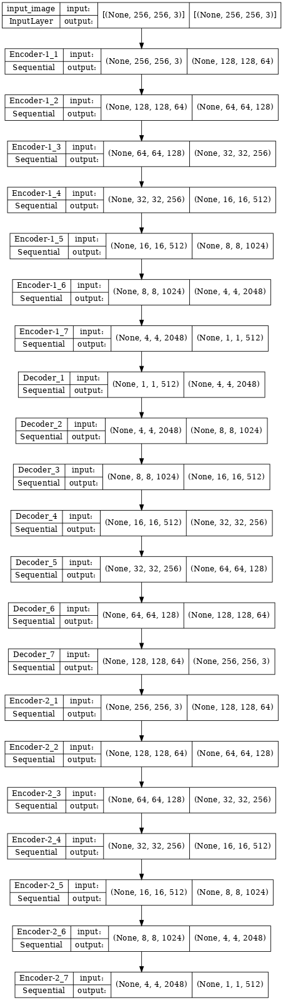

In [24]:
tf.keras.utils.plot_model(NetG, show_shapes=True, dpi=64, to_file='Generator_model.png',)

### Discriminator

In [25]:
def Discriminator(opt):
    
    # Source image input
    x = tf.keras.layers.Input(shape=opt.image_shape, name='input_image')
    
    # Encoder output
    d_0 = tf.keras.layers.GaussianNoise(0.1)(x, training=True)
    d_1 = downsample(opt.filters, use_bn=False, encdec='Discriminator_encoder_1')(d_0)  # (batch_size, 128, 128, 64)
    d_2 = downsample(opt.filters*2, use_bn=False, use_sn=True, encdec='Discriminator_encoder_2')(d_1)  # (batch_size, 64, 64, 128)
    d_3 = downsample(opt.filters*4, use_bn=False, use_sn=True, encdec='Discriminator_encoder_3')(d_2)   # (batch_size, 32, 32, 256)
    d_4 = downsample(opt.filters*8, use_bn=False, use_sn=True, encdec='Discriminator_encoder_4')(d_3)   # (batch_size, 16, 16, 512)
    d_5 = downsample(opt.filters*16, use_bn=False, use_sn=True, encdec='Discriminator_encoder_5')(d_4)   # (batch_size, 8, 8, 512)
    d_last_feature = downsample(opt.filters*32, use_bn=False, use_sn=True, encdec='Discriminator_last_feature')(d_5)   # (batch_size, 4, 4, 512)
    
    d_class = downsample(1, kernel_size=(4,4), strides=(1,1), padding='valid', act_type='sigmoid', use_bn=False, encdec='Discriminator_class')(d_last_feature)   # (batch_size, 1, 1, 1)

    return tf.keras.models.Model(inputs=x, outputs=[d_last_feature, d_class], name='Discriminator')
    

In [26]:
# create the model
NetD = Discriminator(opt)
# summarize the model
NetD.summary(line_length = 150)

Model: "Discriminator"
______________________________________________________________________________________________________________________________________________________
 Layer (type)                                                      Output Shape                                                Param #                
 input_image (InputLayer)                                          [(None, 256, 256, 3)]                                       0                      
                                                                                                                                                      
 gaussian_noise (GaussianNoise)                                    (None, 256, 256, 3)                                         0                      
                                                                                                                                                      
 Discriminator_encoder_1 (Sequential)                              (Non

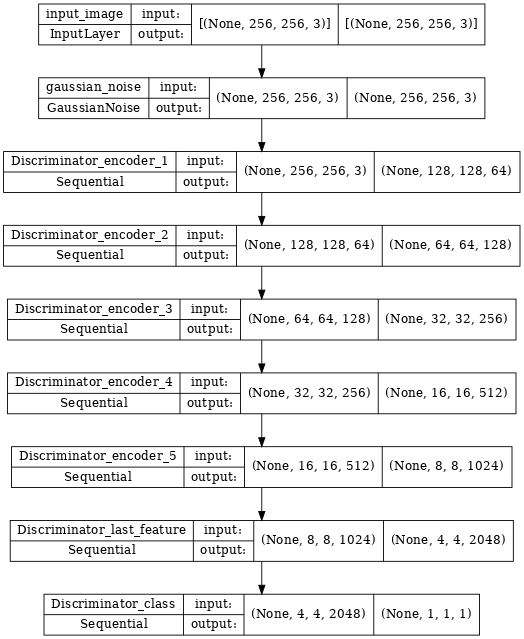

In [27]:
tf.keras.utils.plot_model(NetD, show_shapes=True, show_layer_activations=True, dpi=64, to_file='Discriminator_model.png',)

## Train per step

### Define Loss functions

In [28]:
# Adapted from https://www.kaggle.com/code/jadeblue/dcgans-and-techniques-to-optimize-them/notebook

# randomly flip some labels
def noisy_labels(y, p_flip):
    # determine the number of labels to flip
    n_select = int(p_flip * int(y.shape[0]))
    # choose labels to flip
    flip_ix = np.random.choice([i for i in range(int(y.shape[0]))], size=n_select)
    
    op_list = []
    # invert the labels in place
    #y_np[flip_ix] = 1 - y_np[flip_ix]
    
    for i in range(int(y.shape[0])):
        if i in flip_ix:
            op_list.append(tf.subtract(1.0, y[i]))    
        else:
            op_list.append(y[i])
    
    outputs = tf.stack(op_list)
    return outputs

''' Label smoothing -- technique from GAN hacks, instead of assigning 1/0 as class 
    labels, we assign a random integer in range [0.9, 1.0] for positive class
    and [0.0, 0.1] for negative class '''

def smooth_positive_labels(y):
    return tf.abs(y - np.random.random(y.shape) * 0.1)

def smooth_negative_labels(y):
    return np.random.random(y.shape) * 0.1 + y

In [29]:
bce_loss = tf.keras.losses.BinaryCrossentropy(name='bce_loss', from_logits=False)
# l2_loss = tf.keras.losses.MeanSquaredError()
# l1_loss = tf.keras.losses.MeanAbsoluteError()

def generator_loss(
    feat_real, feat_fake,
    pred_fake,
    x, x_hat,
    z, z_o):
    
    ''' Backpropagating through NetG '''

    # g_adv = (l2_loss(feat_real, feat_fake) + bce_loss(tf.ones_like(pred_fake), pred_fake)) * opt.w_adv
    # g_con = l1_loss(x, x_hat) * opt.w_con
    # g_enc = l2_loss(z, z_o) * opt.w_enc 
    g_adv = (tf.reduce_mean(tf.square(feat_real - feat_fake)) + bce_loss(tf.ones_like(pred_fake), pred_fake)) * opt.w_adv
    g_con = tf.reduce_mean(tf.abs(x - x_hat)) * opt.w_con
    g_enc = tf.reduce_mean(tf.square(z - z_o)) * opt.w_enc 


    g_loss = g_adv + g_con + g_enc

    return g_adv, g_con, g_enc, g_loss

def discriminator_loss(pred_real,
                       pred_fake):

    ''' Backpropagating through NetD '''
    
    real_noisy = noisy_labels(tf.ones_like(pred_real), 0.05)  # add noise to real labels with prob of 0.05
    fake_noisy = noisy_labels(tf.zeros_like(pred_fake), 0.05) # add noise to fake labels with prob of 0.05
    
    real_smooth = smooth_positive_labels(real_noisy)  # random number between 0.9 and 1 for real labels
    fake_smooth = smooth_negative_labels(fake_noisy) # random number between 0 and 0.1 for fake labels
    
    d_real = bce_loss(real_smooth, pred_real) 
    d_fake = bce_loss(fake_smooth, pred_fake)  

    # d_real = bce_loss(tf.ones_like(pred_real), pred_real)
    # d_fake = bce_loss(tf.zeros_like(pred_fake), pred_fake) 
    d_loss = d_real + d_fake

    return d_real, d_fake, d_loss

### Optimizers

In [30]:
generator_optimizer = tf.keras.optimizers.Adam(opt.lr_g, beta_1=opt.beta1, beta_2=opt.beta2)
discriminator_optimizer = tf.keras.optimizers.Adam(opt.lr_d, beta_1=opt.beta1, beta_2=opt.beta2)

### Checkpoint

In [31]:
checkpoint_dir = opt.ckpt_dir
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=NetG,
                                 discriminator=NetD)

### Generate Images

2023-01-08 03:03:01.416725: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8101


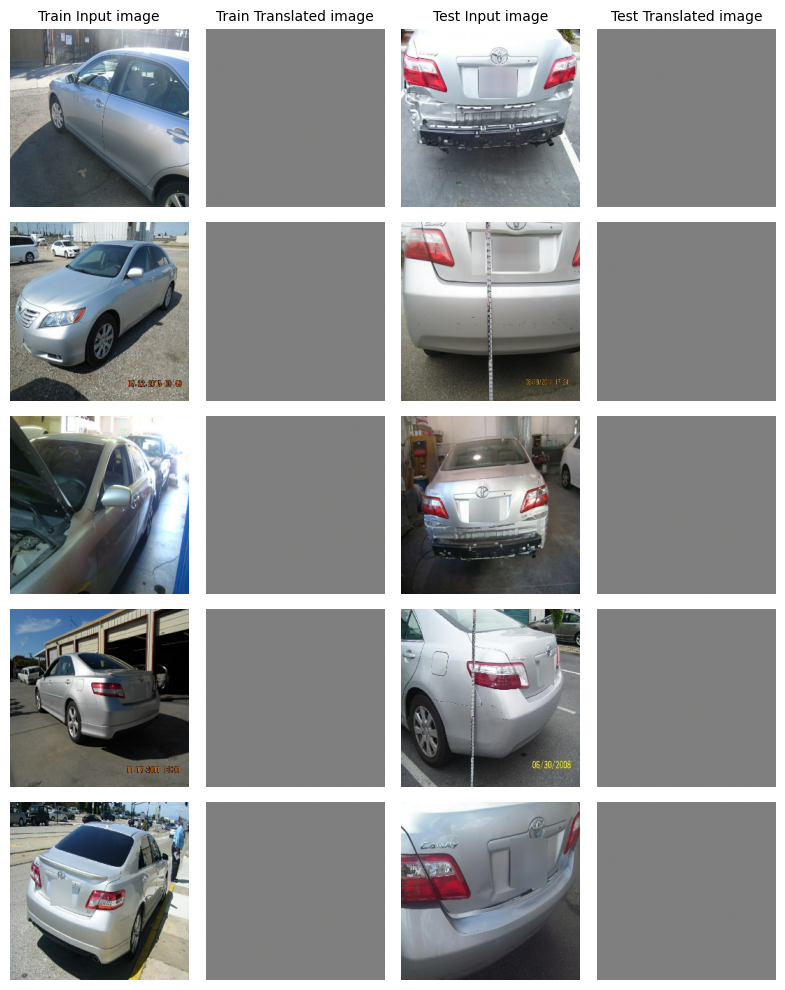

In [32]:
def generate_images(model, train_ds, test_ds, num_img, output):
    fig, ax = plt.subplots(num_img, 4, figsize=(8, 10))
    for i, img_train in enumerate(train_ds.take(num_img)):
        [_, x_hat_train, _] = model(img_train, training=False)
        x_hat_train = (x_hat_train[0] * 127.5 + 127.5).numpy().astype(np.uint8)
        x_train = (img_train[0] * 127.5 + 127.5).numpy().astype(np.uint8)

        ax[i, 0].imshow(x_train, cmap='gray')
        ax[i, 1].imshow(x_hat_train, cmap='gray')
        ax[0, 0].set_title("Train Input image", fontsize=10)
        ax[0, 1].set_title("Train Translated image", fontsize=10)
        ax[i, 0].axis("off")
        ax[i, 1].axis("off")
        
    for i, img_test in enumerate(test_ds.take(num_img)):
        [_, x_hat_test, _] = model(img_test, training=False)
        x_hat_test = (x_hat_test[0] * 127.5 + 127.5).numpy().astype(np.uint8)
        x_test = (img_test[0] * 127.5 + 127.5).numpy().astype(np.uint8)

        ax[i, 2].imshow(x_test, cmap='gray')
        ax[i, 3].imshow(x_hat_test, cmap='gray')
        ax[0, 2].set_title("Test Input image", fontsize=10)
        ax[0, 3].set_title("Test Translated image", fontsize=10)
        ax[i, 2].axis("off")
        ax[i, 3].axis("off")
    
    fig.savefig(output)
        
    plt.tight_layout()
    plt.show()
    plt.close()

output_file = "sample_generated_img.png"
generate_images(NetG, train_dataset, val_dataset, 5, output_file)

### Train Step Function

In [33]:
@tf.function
def train_step(x):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        z, x_hat, z_o = NetG(x, training=True)

        feat_real, pred_real = NetD(x, training=True)
        feat_fake, pred_fake  = NetD(x_hat, training=True)

        g_adv, g_con, g_enc, g_loss = generator_loss(feat_real, feat_fake, pred_fake, x, x_hat, z, z_o)
        d_real, d_fake, d_loss = discriminator_loss(pred_real,pred_fake)

    generator_gradients = gen_tape.gradient(g_loss, NetG.trainable_variables)
    discriminator_gradients = disc_tape.gradient(d_loss, NetD.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, NetG.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, NetD.trainable_variables))
        
    return g_loss, d_loss, g_adv, g_con, g_enc, d_real, d_fake

In [34]:
trainlog = pd.DataFrame(columns=['EPOCH', 'Steps', 'G_loss', 'D_loss', 'g_adv', 'g_con', 'g_enc', 'd_X', 'd_X_hat'])

### Fit Function

In [35]:
# Adapted from https://www.tensorflow.org/tutorials/generative/pix2pix
def fit(train_ds, val_ds, epochs):
    start = time.time()
    global_step=0
    for epoch in range(epochs):
        start = time.time()

        G_losses = []
        D_losses = []
        
        step=0
        for image_batch in train_ds:
            global_step+=1
            step+=1

            G_loss, D_loss, g_adv, g_con, g_enc, d_x, d_x_hat = train_step(image_batch)
            trainlog.loc[len(trainlog)] = [epoch+1, global_step, G_loss.numpy(), D_loss.numpy(), g_adv.numpy(), g_con.numpy(), g_enc.numpy(), d_x.numpy(), d_x_hat.numpy()]
            
            G_losses.append(G_loss)
            D_losses.append(D_loss)

            print ("\033[1mGlobal Steps\033[0m: {}, \033[1mEpoch Steps\033[0m: {},\
                   \033[91mG_LOSS\033[0m: {:.4f}, \033[91mD_LOSS\033[0m: {:.4f}, \
                   \033[94mg_adv\033[0m: {:.4f}, \033[94mg_con\033[0m: {:.4f}, \033[94mg_enc\033[0m: {:.4f}, \
                   \033[92md_real\033[0m: {:.4f}, \033[92md_fake\033[0m: {:.4f}"
                   .format(global_step, 
                            step, 
                            G_loss.numpy(), 
                            D_loss.numpy(),
                            g_adv.numpy(), 
                            g_con.numpy(),
                            g_enc.numpy(),
                            d_x.numpy(), 
                            d_x_hat.numpy()
                           ),
                   end='', flush=True)
            print('\r', end='')
                
       
        display.clear_output(wait=True)
        print (f"Epoch : {epoch+1}, \t Time : {time.time()-start:.2f} sec/n, \t Gen Loss mean : {np.mean(G_losses):.4f}, std: {np.std(G_losses):.4f}; \t Dis Loss mean : {np.mean(D_losses):.4f}, std: {np.std(D_losses):.4f};")
         # Generate training and validation images
        output_file = f"GANomaly_SN_gen_imgs/generated_imgs_{epoch+1}.png"
        generate_images(NetG, train_ds, val_ds, 5, output_file)
        
        # plot the losses
        plt.figure(figsize=(10,4))
        plt.title("Generator and Discriminator Loss - EPOCH {}".format(epoch+1))
        plt.plot(G_losses,label="G")
        plt.plot(D_losses,label="D")
        plt.xlabel("Iterations")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid(True, linestyle='--')
        ymax = plt.ylim()[1]
        plt.show()
        
        trainlog.plot(x="Steps", y=["D_loss", "G_loss"], figsize=(10, 4), ylim=(0,30))
        plt.title("All Time Loss")
        plt.ylabel("Loss")
        plt.xlabel("Iterations")
        G_loss_smoothed = gaussian_filter1d(trainlog.G_loss, sigma=25)
        plt.plot(trainlog.Steps, G_loss_smoothed)
        plt.grid(True, linestyle='--')
        plt.show()
         
        if (epoch+1) % 300 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)
            

Epoch : 300, 	 Time : 449.38 sec/n, 	 Gen Loss mean : 4.5368, std: 0.6036; 	 Dis Loss mean : 1.4068, std: 0.6700;


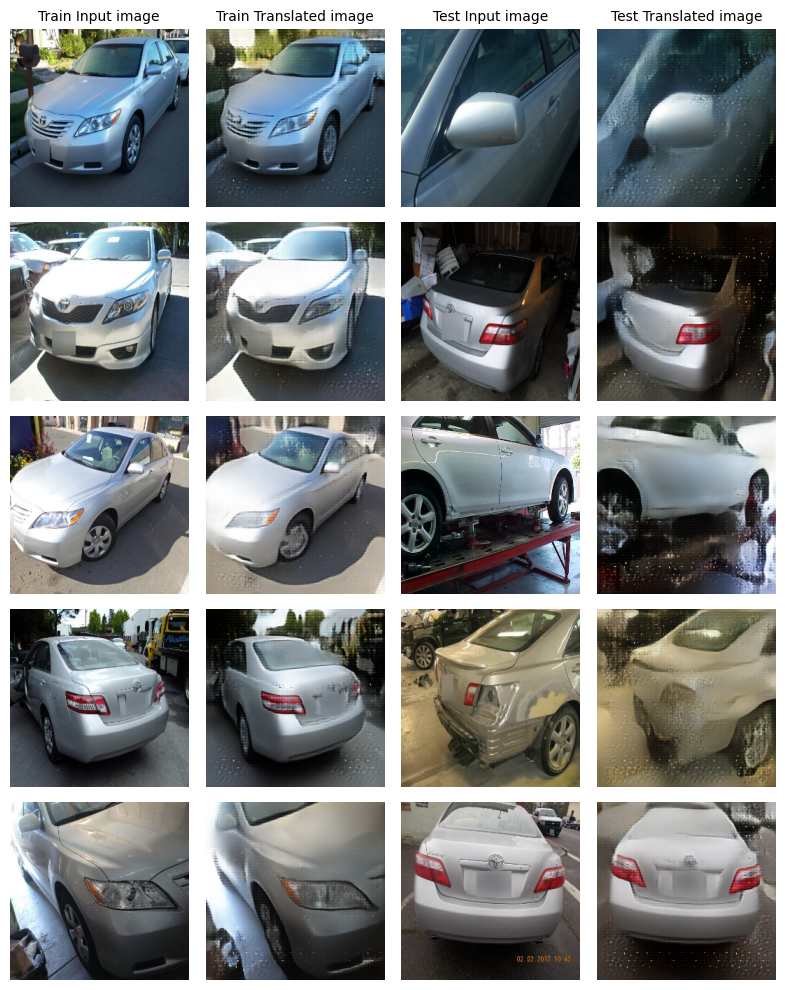

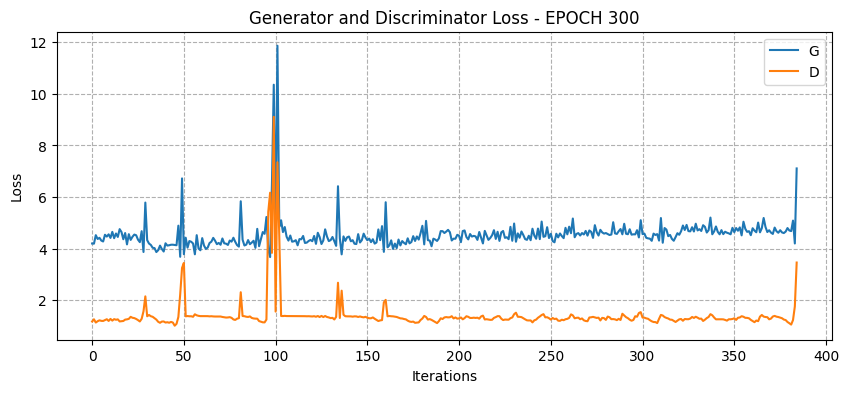

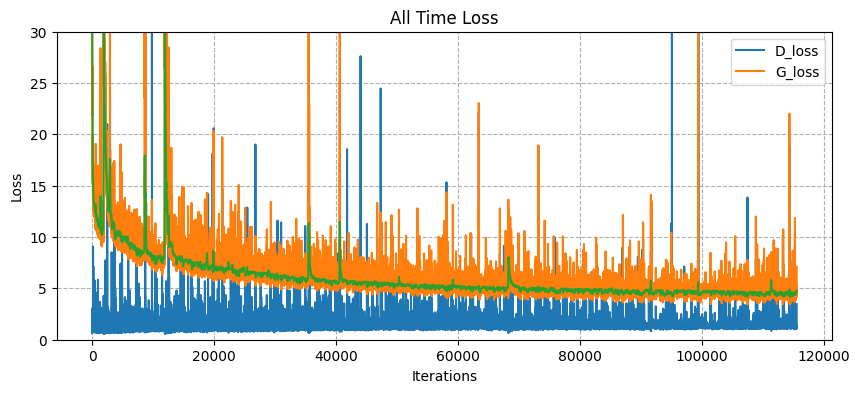

In [36]:
fit(train_dataset, val_dataset, epochs=300)

## Trainlog

In [37]:
trainlog.to_csv('trainlog_GANomaly_SN.csv', index=False)

In [38]:
trainlog = pd.read_csv('trainlog_GANomaly_SN.csv.csv')

In [39]:
trainlog

,EPOCH,Steps,G_loss,D_loss,g_adv,g_con,g_enc,d_X,d_X_hat
0,1.0,1.0,39.217091,1.376999,0.690382,25.194763,13.331944,0.681752,0.695247
1,1.0,2.0,59.055336,1.293274,0.454975,23.643633,34.956726,0.337581,0.955693
2,1.0,3.0,43.188946,1.527748,0.891082,24.344959,17.952904,0.964214,0.563534
3,1.0,4.0,43.316826,1.055102,0.827597,23.771309,18.717918,0.456703,0.598398
4,1.0,5.0,44.794865,0.777044,1.579437,24.395634,18.819794,0.420171,0.356873
...,...,...,...,...,...,...,...,...,...
115495,300.0,115496.0,4.702588,1.108485,0.886027,3.807516,0.009045,0.528432,0.580053
115496,300.0,115497.0,4.679265,1.054778,0.859043,3.810840,0.009382,0.417380,0.637399
115497,300.0,115498.0,5.085571,1.230923,1.179559,3.896297,0.009716,0.760643,0.470280
115498,300.0,115499.0,4.198914,1.756580,0.305333,3.883153,0.010428,0.362657,1.393923


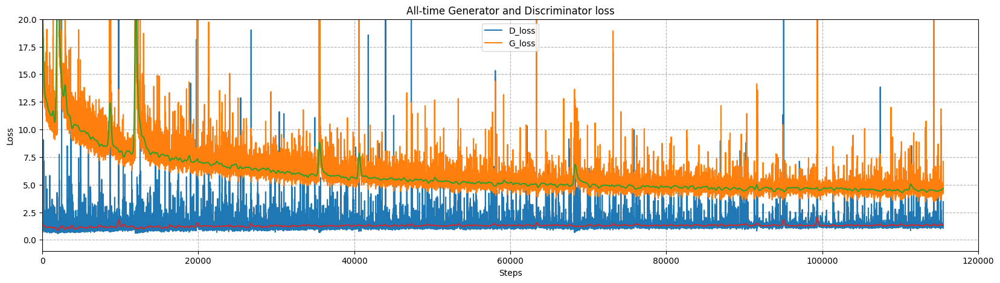

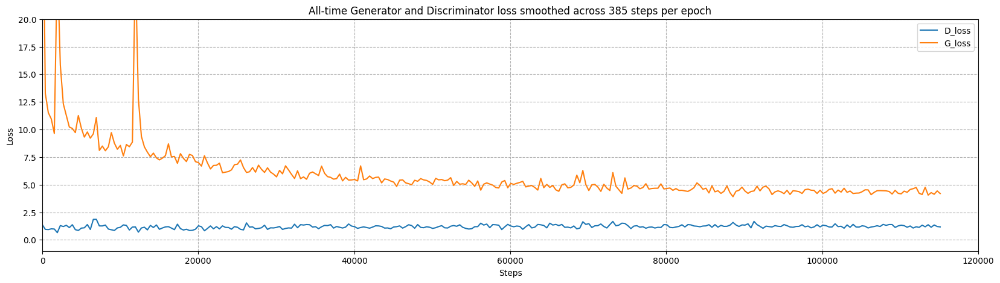

In [41]:
# Plot Discriminator and Generator Losses
trainlog.plot(x="Steps", y=["D_loss", "G_loss"], figsize=(20, 5), ylim=(-1,20))
G_loss_smoothed = gaussian_filter1d(trainlog.G_loss, sigma=100)
D_loss_smoothed = gaussian_filter1d(trainlog.D_loss, sigma=100)
plt.plot(trainlog.Steps, G_loss_smoothed)
plt.plot(trainlog.Steps, D_loss_smoothed)
plt.grid(True, linestyle='--')
plt.ylabel("Loss")
plt.xlim(0, 120000)
plt.title("All-time Generator and Discriminator loss")
plt.show()

plt.figure(figsize=(20,5))
Disc_Loss = trainlog.D_loss[::385]
Gen_Loss = trainlog.G_loss[::385]
steps = trainlog.Steps[::385]
plt.plot(steps, Disc_Loss, label='D_loss')
plt.plot(steps, Gen_Loss, label='G_loss')
plt.grid(True, linestyle='--')
plt.legend(loc="upper right")
plt.ylim(-1, 20)
plt.xlim(0, 120000)
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("All-time Generator and Discriminator loss smoothed across 385 steps per epoch")
plt.show()

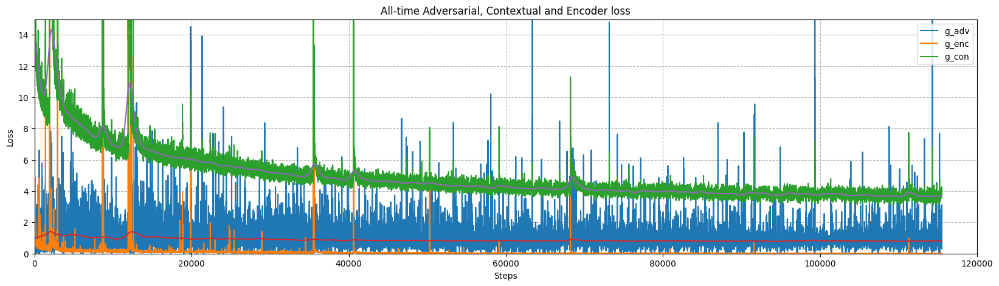

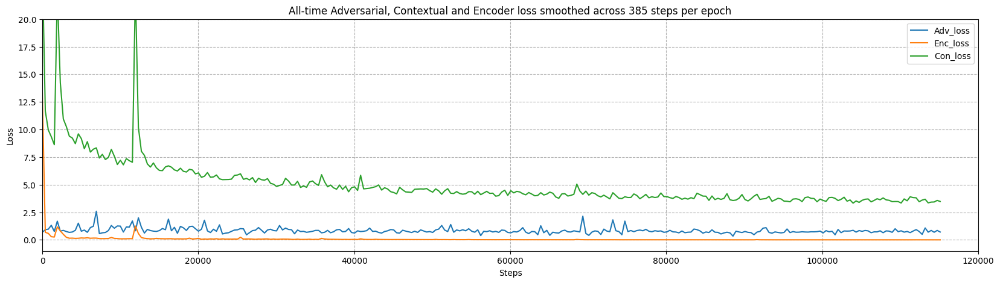

In [44]:
# plot Adversarial, Contextual and Encoder Losses
trainlog.plot(x="Steps", y=["g_adv", "g_enc", "g_con"], figsize=(20, 5), ylim=(0,15))
g_adv_smoothed = gaussian_filter1d(trainlog.g_adv, sigma=385)
g_con_smoothed = gaussian_filter1d(trainlog.g_con, sigma=385)
plt.plot(trainlog.Steps, g_adv_smoothed)
plt.plot(trainlog.Steps, g_con_smoothed)
plt.grid(True, linestyle='--')
plt.ylabel("Loss")
plt.xlim(0, 120000)
plt.title("All-time Adversarial, Contextual and Encoder loss")
plt.show()

plt.figure(figsize=(20,5))
Adv_loss = trainlog.g_adv[::385]
Enc_loss = trainlog.g_enc[::385]
Con_loss = trainlog.g_con[::385]
steps = trainlog.Steps[::385]
plt.plot(steps, Adv_loss, label='Adv_loss')
plt.plot(steps, Enc_loss, label='Enc_loss')
plt.plot(steps, Con_loss, label='Con_loss')
plt.grid(True, linestyle='--')
plt.legend(loc="upper right")
plt.ylim(-1, 20)
plt.xlim(0, 120000)
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("All-time Adversarial, Contextual and Encoder loss smoothed across 385 steps per epoch")
plt.show()

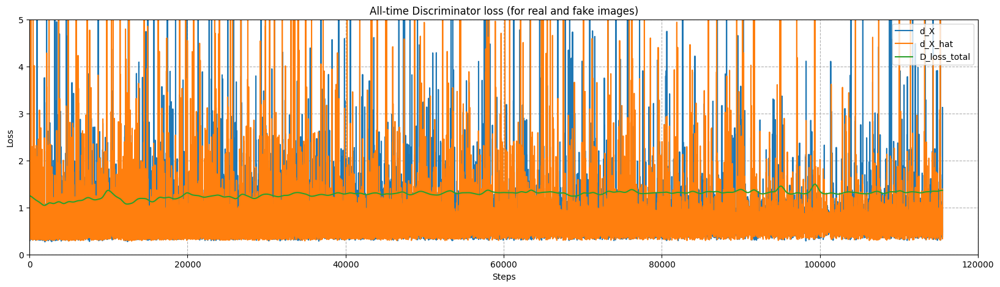

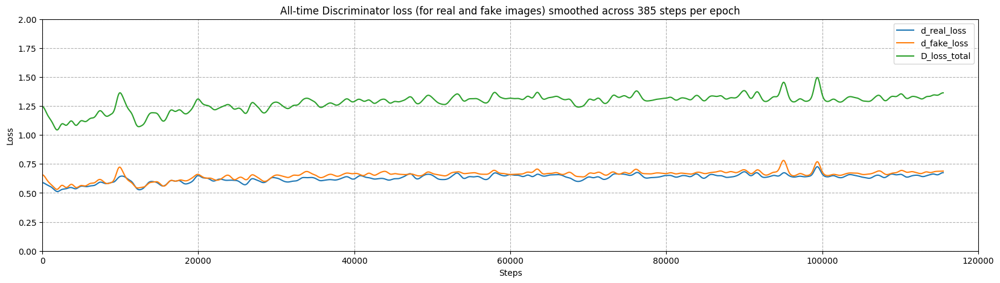

In [45]:
# plot Discriminator Losses
trainlog.plot(x="Steps", y=["d_X", "d_X_hat"], figsize=(20, 5))
D_loss_smoothed = gaussian_filter1d(trainlog.D_loss, sigma=385)
plt.plot(trainlog.Steps, D_loss_smoothed, label='D_loss_total')
plt.grid(True, linestyle='--')
plt.legend(loc="upper right")
plt.ylim(0, 5)
plt.xlim(0, 120000)
plt.ylabel("Loss")
plt.title("All-time Discriminator loss (for real and fake images)")
plt.show()


plt.figure(figsize=(20,5))
d_x_smoothed = gaussian_filter1d(trainlog.d_X, sigma=385)
d_x_hat_smoothed = gaussian_filter1d(trainlog.d_X_hat, sigma=385)
D_loss_smoothed = gaussian_filter1d(trainlog.D_loss, sigma=385)
plt.plot(trainlog.Steps, d_x_smoothed, label='d_real_loss')
plt.plot(trainlog.Steps, d_x_hat_smoothed, label='d_fake_loss')
plt.plot(trainlog.Steps, D_loss_smoothed, label='D_loss_total')
plt.legend(loc="upper right")
plt.xlim(0, 120000)
plt.grid(True, linestyle='--')
plt.ylim(0,2)
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("All-time Discriminator loss (for real and fake images) smoothed across 385 steps per epoch")
plt.show()

## FID Score

In [46]:
ls {checkpoint_dir}

checkpoint  ckpt-1.data-00000-of-00001  ckpt-1.index


In [47]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [48]:
# The following FID calculation code has been adapted from Machine learning mastery
# https://machinelearningmastery.com/how-to-implement-the-frechet-inception-distance-fid-from-scratch/

# Inceptionv3 model for FID calculation
from tensorflow.keras.applications.inception_v3 import InceptionV3
INCEPTION_SHAPE = (299, 299, 3)

inception = InceptionV3(include_top=False, pooling='avg', input_shape=INCEPTION_SHAPE)

def scale_images(images, new_shape):
    """
    Scales images into new shape by interpolation since inception model requires that
    :param images: List of images
    :param new_shape: The transformed shape
    :return: Transformed images
    """

    images_list = list()

    for image in images:
        new_image = resize(image, new_shape)
        images_list.append(new_image)
    
    return np.asarray(images_list)


def calculate_fid(model, images1, images2):
    """

    Calculates the FID with the inception last layer activations
    :param model: THe model (eg: inception)
    :param images1: List of images grouo 1
    :param images1: List of images grouo 2
    :return: FID score
    """
    
    act1 = model.predict(images1)
    act2 = model.predict(images2)

    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)

    ssdiff = np.sum((mu1 - mu2) ** 2.0)

    covmean = sqrtm(sigma1.dot(sigma2))

    if np.iscomplexobj(covmean):
        covmean = covmean.real

    # Equation for FID score calculation
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)  

    return fid

In [49]:
from tensorflow.python.ops.numpy_ops import np_config
from tensorflow.keras.applications.inception_v3 import preprocess_input
from scipy.linalg import sqrtm
np_config.enable_numpy_behavior()
FID_BATCH_SIZE = 10

from skimage.transform import resize
fid_train_total = []
for i, x in enumerate(train_dataset.take(50)):
    [_, x_hat, _] = NetG(x, training=False)
    x = scale_images(x.astype('float32'), INCEPTION_SHAPE)
    x_hat = scale_images(x_hat.astype('float32'), INCEPTION_SHAPE)
    x = preprocess_input(x)
    x_hat = preprocess_input(x_hat)
    cur_fid_score = calculate_fid(inception, x, x_hat)
    fid_train_total.append(cur_fid_score)
    print(cur_fid_score)

3.716252580351175
3.6867009099770183
4.631579749889837
3.3059852255034734
3.6084419748872434
4.174489398226012
3.372729281455345
3.975230515947696
3.712130203427084
3.751803548425513
3.94168452950768
3.541857692843925
3.8481366453190873
3.679712255982919
4.24959332083763
3.6379990763836147
4.096660971139377
4.194110797647808
3.679851642374243
3.964723390167817
4.880197697506167
3.8252825621262945
3.3659196061255097
4.338726075177652
4.410061546669798
3.9168675026385382
4.8159295119790455
4.189072709323083
4.3069381615020355
3.6465271908252372
4.191341385669576
4.416729045670812
4.230548368352886
4.156613091999055
3.7750228789226643
3.694538886938558
3.7884527263495054
3.8542274169373054
3.82049432726427
3.6768109013945507
3.836070583324638
3.936148869240877
3.9633238297251303
4.243935025655168
3.8854462361498627
3.7521612711854084
3.9066397175907444
4.407212546959945
3.9901719362102086
4.071828261766395


In [50]:
print(f'Mean Fid Score for train dataset: {np.mean(fid_train_total):.4f}')
print(f'Standard Deviation Fid Score for train dataset: {np.std(fid_train_total):.4f}')

Mean Fid Score for train dataset: 3.9613
Standard Deviation Fid Score for train dataset: 0.3402


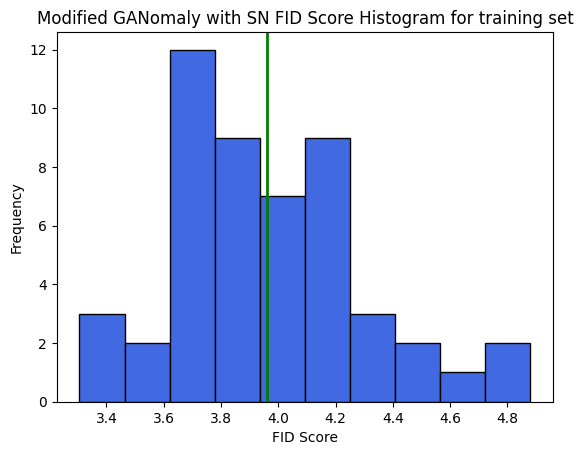

In [86]:
import statistics

plt.hist(fid_train_total, bins=10, color='royalblue', edgecolor='k')

mean = statistics.mean(fid_train_total)
std = statistics.stdev(fid_train_total)

plt.axvline(mean, color='g', lw=2.0)

plt.xlabel("FID Score")
plt.ylabel("Frequency")
plt.title("Modified GANomaly with SN FID Score Histogram for training set")
plt.show()

In [87]:
fid_test_total = []
for i, x in enumerate(val_dataset.take(50)):
    [_, x_hat, _] = NetG(x, training=False)
    x = scale_images(x.astype('float32'), INCEPTION_SHAPE)
    x_hat = scale_images(x_hat.astype('float32'), INCEPTION_SHAPE)
    x = preprocess_input(x)
    x_hat = preprocess_input(x_hat)
    cur_fid_score = calculate_fid(inception, x, x_hat)
    fid_test_total.append(cur_fid_score)
    print(cur_fid_score)

22.453866001834808
9.018068161405186
17.89344232999678
11.32576725363679
17.56121028721399
6.980617183541621
16.257190072185516
15.171143807462261
16.0375055358585
15.018496266352166
19.2240329094881
8.41613278067369
23.624837140288914
11.7051200421108
9.17377151223166
21.301413080088302
14.74222378897146
21.574647681716215
12.986668027710921
24.023354945760385
16.748157282119298
16.818976596603264
15.462583325125294
19.06903165038123
13.927111698708227
18.89694879513693
12.457962428509857
11.3617621534966
18.303692200650048
13.466949823365532
15.166220686382921
10.26557476724411
11.716827705289711
9.861679595614394
14.593424230043782
11.067508548399614
14.161834037518723
11.542267813705752
16.794089473987583
12.734836600768617
10.65754106766553
10.928894986168505
13.84005166457456
16.500736473941913
18.915356699336687
18.41340444591742
15.28294052083108
10.658376723019664
19.462444098589206
12.10267822147903


In [88]:
print(f'Mean Fid Score for test dataset: {np.mean(fid_test_total):.4f}')
print(f'Standard Deviation Fid Score for test dataset: {np.std(fid_test_total):.4f}')

Mean Fid Score for test dataset: 14.9134
Standard Deviation Fid Score for test dataset: 4.0428


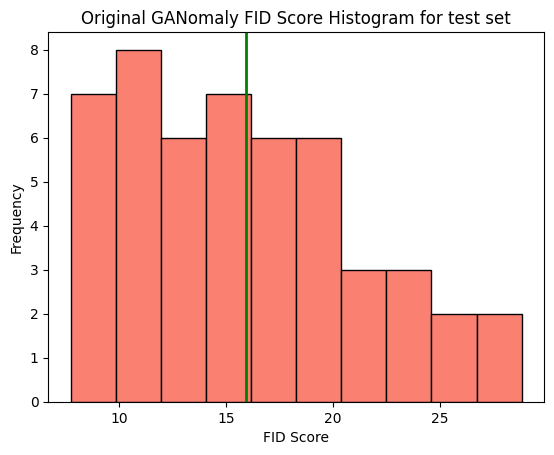

In [54]:
import statistics

plt.hist(fid_test_total, bins=10, color='salmon', edgecolor='k')

mean = statistics.mean(fid_test_total)
std = statistics.stdev(fid_test_total)

plt.axvline(mean, color='g', lw=2.0)

plt.xlabel("FID Score")
plt.ylabel("Frequency")
plt.title("Original GANomaly FID Score Histogram for test set")
plt.show()

In [52]:
ls {checkpoint_dir}

checkpoint  ckpt-1.data-00000-of-00001  ckpt-1.index


In [53]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [49]:
# The following FID calculation code has been adapted from Machine learning mastery
# https://machinelearningmastery.com/how-to-implement-the-frechet-inception-distance-fid-from-scratch/

# Inceptionv3 model for FID calculation
from tensorflow.keras.applications.inception_v3 import InceptionV3
INCEPTION_SHAPE = (299, 299, 3)

inception = InceptionV3(include_top=False, pooling='avg', input_shape=INCEPTION_SHAPE)

def scale_images(images, new_shape):
    """
    Scales images into new shape by interpolation since inception model requires that
    :param images: List of images
    :param new_shape: The transformed shape
    :return: Transformed images
    """

    images_list = list()

    for image in images:
        new_image = resize(image, new_shape)
        images_list.append(new_image)
    
    return np.asarray(images_list)


def calculate_fid(model, images1, images2):
    """

    Calculates the FID with the inception last layer activations
    :param model: THe model (eg: inception)
    :param images1: List of images grouo 1
    :param images1: List of images grouo 2
    :return: FID score
    """
    
    act1 = model.predict(images1)
    act2 = model.predict(images2)

    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)

    ssdiff = np.sum((mu1 - mu2) ** 2.0)

    covmean = sqrtm(sigma1.dot(sigma2))

    if np.iscomplexobj(covmean):
        covmean = covmean.real

    # Equation for FID score calculation
    fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)  

    return fid

In [50]:
from tensorflow.python.ops.numpy_ops import np_config
from tensorflow.keras.applications.inception_v3 import preprocess_input
from scipy.linalg import sqrtm
np_config.enable_numpy_behavior()
# for x in train_dataset:
FID_BATCH_SIZE = 10

from skimage.transform import resize
fid_train_total = []
for i, x in enumerate(train_dataset.take(10)):
    [_, x_hat, _] = NetG(x, training=False)
    x = scale_images(x.astype('float32'), INCEPTION_SHAPE)
    x_hat = scale_images(x_hat.astype('float32'), INCEPTION_SHAPE)
    x = preprocess_input(x)
    x_hat = preprocess_input(x_hat)
    cur_fid_score = calculate_fid(inception, x, x_hat)
    fid_train_total.append(cur_fid_score)
    print(cur_fid_score)
    
print(f'Mean Fid Score for train dataset: {np.mean(fid_train_total):.4f}')

10.350085917225208
10.869783103268233
11.082342603312448
10.231408640615312
12.945621549736554
10.521501139976632
10.220852895402013
9.256475988160158
10.841107823590676
11.329338349962832
Mean Fid Score for train dataset: 10.7649


In [51]:
fid_test_total = []
for i, x in enumerate(val_dataset.take(10)):
    [_, x_hat, _] = NetG(x, training=False)
    x = scale_images(x.astype('float32'), INCEPTION_SHAPE)
    x_hat = scale_images(x_hat.astype('float32'), INCEPTION_SHAPE)
    x = preprocess_input(x)
    x_hat = preprocess_input(x_hat)
    cur_fid_score = calculate_fid(inception, x, x_hat)
    fid_test_total.append(cur_fid_score)
    print(cur_fid_score)
    
print(f'Mean Fid Score for test dataset: {np.mean(fid_test_total):.4f}')

14.069207102420526
17.442772528158002
23.555745013881783
23.930887395860616
17.335478354273413
25.740326438777966
12.122491930832973
19.379518689233095
33.032592704813624
18.6844187422078
Mean Fid Score for test dataset: 20.5293


## Inference

In [56]:
# Run the trained model on a few examples from the test set
def generate_test_images(model, dataset, num_img):
    fig, ax = plt.subplots(num_img, 2, figsize=(5, num_img * 2 ))
    for i, img in enumerate(dataset.take(num_img)):
        [z, x_hat, z_o] = model(img, training=False)
        x_hat = (x_hat[0] * 127.5 + 127.5).numpy().astype(np.uint8)
        x = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

        ax[i, 0].imshow(x)
        ax[i, 1].imshow(x_hat)
        ax[0, 0].set_title("Input image")
        ax[0, 1].set_title("Translated image")
        ax[i, 0].axis("off")
        ax[i, 1].axis("off")
        
    # fig.savefig(output)
        
    plt.tight_layout()
    plt.show()
    plt.close()

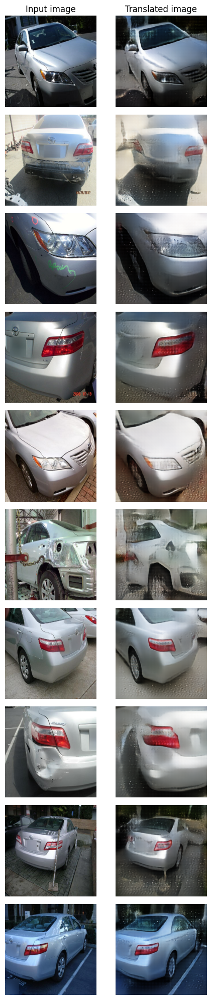

In [89]:
generate_test_images(NetG, val_dataset, 10)

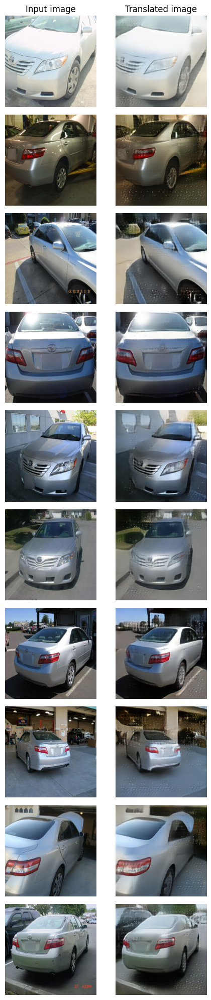

In [65]:
generate_test_images(NetG, train_dataset, 10)